In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.datasets import fetch_openml

from sklearn.linear_model import SGDClassifier

from sklearn.model_selection import cross_val_score,cross_val_predict

from sklearn.metrics import confusion_matrix,precision_score,recall_score,f1_score,precision_recall_curve

In [2]:
mnist=fetch_openml('mnist_784',version=1)

In [3]:
mnist.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

In [4]:
X,y=mnist['data'],mnist['target']

In [5]:
print(y[0],type(y[0]))

5 <class 'str'>


In [6]:
## as the target variable contains a number but in string type, we need to convert variable y to int

In [7]:
y=y.astype(np.uint8)

In [8]:
print(y[0],type(y[0]))

5 <class 'numpy.uint8'>


In [9]:
print(X.shape,y.shape)

(70000, 784) (70000,)


In [10]:
X.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
## so the entire dataset contains 70000 rows, 784 feature columns & 1 target column
## and every feature column denotes certain pixel content value

In [12]:
some_digit=X.loc[0].to_numpy()

In [13]:
some_digit_image=some_digit.reshape(28,28)

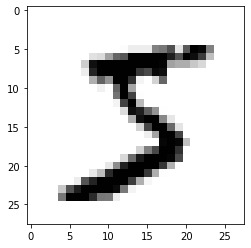

In [14]:
plt.imshow(some_digit_image,cmap='binary')

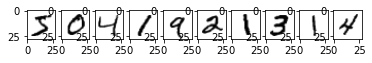

In [15]:
figure,axis=plt.subplots(1,10)
for i in range(10):
    axis[i].imshow(X.loc[i].to_numpy().reshape(28,28),cmap='binary')
    

In [16]:
## split train test set

In [17]:
X_train,X_test,y_train,y_test=X[:60000],X[60000:],y[:60000],y[60000:]

In [18]:
y_train_5=(y_train==5)
y_test_5=(y_test==5)

In [19]:
sgd_clf=SGDClassifier(random_state=42)

In [20]:
sgd_clf.fit(X_train,y_train_5)

SGDClassifier(random_state=42)

In [21]:
cross_val_score(sgd_clf,X_train,y_train_5,scoring='accuracy')

array([0.95466667, 0.96975   , 0.9635    , 0.96533333, 0.94841667])

In [22]:
y_train_predict=sgd_clf.predict(X_train)

In [23]:
confusion_matrix(y_train_5,y_train_predict)

array([[52316,  2263],
       [  601,  4820]])

In [24]:
precision_score(y_train_predict,y_train_5)

0.8891348459693783

In [25]:
recall_score(y_train_predict,y_train_5)

0.6805026118876183

In [26]:
f1_score(y_train_predict,y_train_5)

0.7709532949456175

In [27]:
y_scores=cross_val_predict(sgd_clf,X_train,y_train_5,cv=3,method='decision_function')

In [28]:
y_scores.shape

(60000,)

In [29]:
precisions,recalls,thresholds=precision_recall_curve(y_train_5,y_scores)

(59967,)

In [52]:
tpr_df=pd.DataFrame(np.c_[thresholds,precisions[:-1],recalls[:-1]],columns=['Thresholds','Precisions','Recalls'])

In [54]:
tpr_df

,Thresholds,Precisions,Recalls
0,-106527.453005,0.090401,1.000000
1,-105763.222401,0.090386,0.999816
2,-105406.296523,0.090388,0.999816
3,-104799.721326,0.090389,0.999816
4,-104613.214899,0.090391,0.999816
...,...,...,...
59961,36801.606970,1.000000,0.000922
59962,37026.251165,1.000000,0.000738
59963,38871.263919,1.000000,0.000553
59964,42216.055628,1.000000,0.000369


In [30]:
thresholds

array([-106527.45300471, -105763.22240074, -105406.2965229 , ...,
         38871.26391927,   42216.05562787,   49441.43765905])

In [47]:
def plot_precision_recall_vs_threshold(precisions,recalls,thresholds):
    plt.plot(thresholds,precisions[:-1],'b--',label="Precision")
    plt.plot(thresholds,recalls[:-1],'g-',label="Recall")
    plt.legend()
    plt.grid()

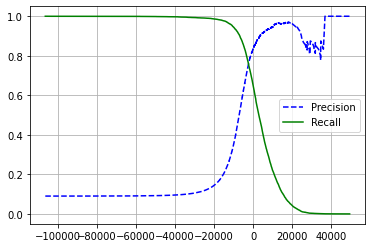

In [48]:
plot_precision_recall_vs_threshold(precisions,recalls,thresholds)

In [49]:
def plot_precision_recall_vs_threshold_plotly(df:pd.DataFrame):
    fig=px.line(data_frame=df,x="Thresholds",y=['Precisions','Recalls'])
    fig.show()

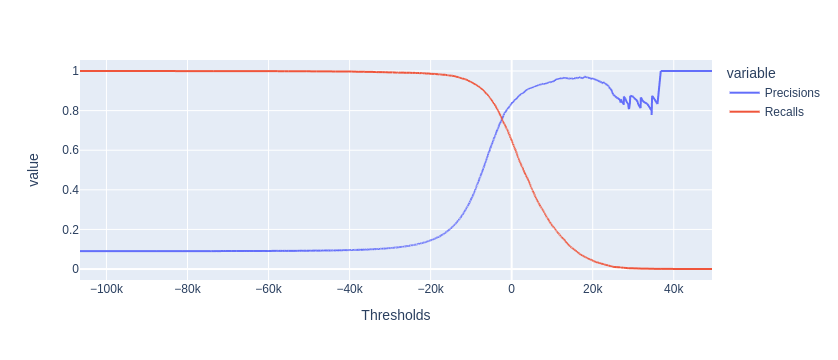

In [55]:
plot_precision_recall_vs_threshold_plotly(tpr_df)

In [61]:
for i in range(len(precisions[:-1])):
    if precisions[i]>=recalls[i]:
        print(thresholds[i])
        break
    
## ORRRRR
thresholds_90_precision=thresholds[np.argmax(precisions>=0.90)]
print(thresholds_90_precision)

thresholds_90_recall=thresholds[np.argmax(recalls>=0.90)]
print(thresholds_90_recall)

-2379.064500932272
3370.019499143958
-106527.45300471183


In [57]:
def plot_precision_vs_recall_plotly(df:pd.DataFrame):
    fig=px.line(data_frame=df,x='Recalls',y='Precisions')
    fig.show()

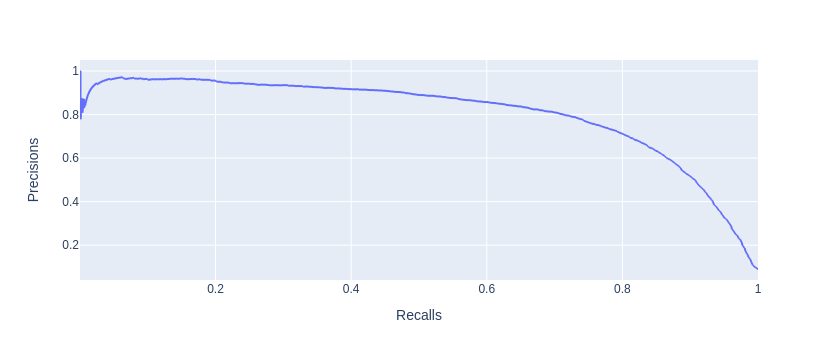

In [58]:
plot_precision_vs_recall_plotly(tpr_df)